# **Тематическое моделирование сообщений с форума Reddit с помощью библиотеки BERTopic**

Этот проект позволяет:

1. Получить данные из Reddit
2. Очистить полученные данные
3. Извлечь главные обсуждаемые темы из обсуждений
4. Сохранить результат в формате csv

Проект можно подстраивать под другие источники информации, что позволяет проводить разные эксперименты.

## Загрузка данных из Reddit:

Извлекаемые данные - комментарии пользователей, поэтому в подробном обзоре не нуждаются.

### Импорт библиотек:

In [1]:
import praw
from datetime import datetime
import configparser
import time
from tqdm import tqdm

### Инициализация Reddit API:

In [2]:
config = configparser.ConfigParser()
config.read("config.ini")

['config.ini']

In [ ]:
reddit = praw.Reddit(
    client_id=config.get("reddit", "client_id"),
    client_secret=config.get("reddit", "client_secret"),
    user_agent=config.get("reddit", "user_agent"),
    check_for_async=False,
)

### Выбор ветки форума:

In [4]:
subreddit = reddit.subreddit("politics")

### Загрузка комментариев из самых обсуждаемых тем за день:

In [5]:
comms = []

# Получаем список самых обсуждаемых тем за день
hot_submissions = subreddit.hot(limit=75)

# Проходим по всем обсуждаемым темам
for submission in tqdm(hot_submissions):
    # Проверяем, что тема была создана за последние 24 часа
    if submission.created_utc > time.time() - 24 * 60 * 60:
        submission.comments.replace_more(
            limit=0
        )  # Загружаем только те комментарии, которые алгоритмы Reddit считают самыми важными
        for comment in submission.comments.list():
            comms.append(comment.body)

75it [01:28,  1.18s/it]


### Вывод первых результатов:

Видно, что в данных присутствуют html элементы, специальные символы и прочий шум. Поэтому, нужно провести очистку данных. 

In [6]:
comms[:20]

["To sort this thread by 'best comments first', [click or tap here](https://www.reddit.com/r/politics/comments/1ge0ldg/rpolitics_2024_us_elections_live_thread_part_54/?sort=confidence).\n\nTo sort this thread by 'newest comments first', [click or tap here](https://www.reddit.com/r/politics/comments/1ge0ldg/rpolitics_2024_us_elections_live_thread_part_54/?sort=new).",
 "Trump's MSG rally last night is the first thing I've ever seen jolt my conservative Puerto Rican relatives into considering not voting for him. I'm gobsmacked; there are easily enough Puerto Ricans in Pennsylvania to turn that state, not to mention the massive Puerto Rican and Cuban population of Florida. My Cuban great uncle who has never voted in his life finally decided that this was the thing that tipped the scales for him. This is so monumental it could put Florida into play.",
 'Posted in the last thread -\n\nHarris and Walz will be in North Carolina on Wednesday.\n\nThis tells you a lot. If they were concerned abo

In [7]:
len(comms)

10967

## Предобработка текста:

### Импорт библиотек:

In [8]:
import spacy
import re

Отключим ненужные шаги в пайплайне spaCy.

In [9]:
# Словари:
# en_core_web_sm
# en_core_web_trf

nlp = spacy.load(
    "en_core_web_sm",
    exclude=["tok2vec", "tagger", "parser", "attribute_ruler", "lemmatizer", "ner"],
)

### Функция очистки текста от html элементов с помощью Regex:

In [10]:
def regex_preprocessing(text):
    text = re.sub(
        r"http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+",
        " ",
        text,
    )
    text = re.sub(
        r"\n|\r|\<.*?\>|\{.*?\}|\[.*?\]|u/|\(.*emote.*\)|\[gif\]|_", " ", text
    )
    text = re.sub(r"[^\w0-9'’“”%]", " ", text)
    return text

### Функция для подготовки текста к моделированию:

BERTopic использует трансформеры. Модель лучше обучается, если получает большую информацию из текста. Поэтому, предобработка минимальная.

In [11]:
def tokenizer_preprocessing(text_list):
    texts = []
    for text in text_list:
        doc = nlp(text)
        tokens = [token.text.lower() for token in doc]
        tokens = " ".join(tokens)
        tokens = tokens.split()
        tokens = [token for token in tokens if not token.isspace()]
        tokens = [token for token in tokens if token != ""]
        tokens = " ".join(tokens)
        texts.append(tokens)
    return texts

### Удалим дубликаты и документы, в которых меньше четырех слов:

In [12]:
import pandas as pd

In [13]:
comms_data = pd.DataFrame(data=comms, columns=["comments"]).drop_duplicates(
    subset="comments", keep=False
)
comms_data = comms_data[comms_data["comments"].str.split().str.len() > 4]

In [14]:
comms_data["comments"].to_list()[:10]

["To sort this thread by 'best comments first', [click or tap here](https://www.reddit.com/r/politics/comments/1ge0ldg/rpolitics_2024_us_elections_live_thread_part_54/?sort=confidence).\n\nTo sort this thread by 'newest comments first', [click or tap here](https://www.reddit.com/r/politics/comments/1ge0ldg/rpolitics_2024_us_elections_live_thread_part_54/?sort=new).",
 "Trump's MSG rally last night is the first thing I've ever seen jolt my conservative Puerto Rican relatives into considering not voting for him. I'm gobsmacked; there are easily enough Puerto Ricans in Pennsylvania to turn that state, not to mention the massive Puerto Rican and Cuban population of Florida. My Cuban great uncle who has never voted in his life finally decided that this was the thing that tipped the scales for him. This is so monumental it could put Florida into play.",
 'Posted in the last thread -\n\nHarris and Walz will be in North Carolina on Wednesday.\n\nThis tells you a lot. If they were concerned abo

### Применим функции для предобработки текста для BERTopic:

In [15]:
clean_data = comms_data["comments"].apply(regex_preprocessing).to_list()
clean_data[:10]

["To sort this thread by 'best comments first'       To sort this thread by 'newest comments first'     ",
 "Trump's MSG rally last night is the first thing I've ever seen jolt my conservative Puerto Rican relatives into considering not voting for him  I'm gobsmacked  there are easily enough Puerto Ricans in Pennsylvania to turn that state  not to mention the massive Puerto Rican and Cuban population of Florida  My Cuban great uncle who has never voted in his life finally decided that this was the thing that tipped the scales for him  This is so monumental it could put Florida into play ",
 'Posted in the last thread    Harris and Walz will be in North Carolina on Wednesday   This tells you a lot  If they were concerned about the essential to win states in this final week  they’d give up NC and focus solely on WI MI PA  But they’re expanding the map  they see opportunities   Optimism guys  It’s another great day for early voting ',
 "It's insane to me that after all the horrible  vile 

In [16]:
clean_data = tokenizer_preprocessing(clean_data)
clean_data[:10]

["to sort this thread by ' best comments first ' to sort this thread by ' newest comments first '",
 "trump 's msg rally last night is the first thing i 've ever seen jolt my conservative puerto rican relatives into considering not voting for him i 'm gobsmacked there are easily enough puerto ricans in pennsylvania to turn that state not to mention the massive puerto rican and cuban population of florida my cuban great uncle who has never voted in his life finally decided that this was the thing that tipped the scales for him this is so monumental it could put florida into play",
 'posted in the last thread harris and walz will be in north carolina on wednesday this tells you a lot if they were concerned about the essential to win states in this final week they ’d give up nc and focus solely on wi mi pa but they ’re expanding the map they see opportunities optimism guys it ’s another great day for early voting',
 "it 's insane to me that after all the horrible vile and unpatriotic bs t

In [17]:
len(clean_data)

9912

### Повторно проверим длину строк и наличие дубликатов после очистки:

In [18]:
clean_data_df = pd.DataFrame(data=clean_data, columns=["comments"]).drop_duplicates(
    subset="comments", keep=False
)
clean_data_df = clean_data_df[clean_data_df["comments"].str.split().str.len() > 4]

In [19]:
clean_data = clean_data_df["comments"].to_list()

### Итоговый список комментариев:

In [20]:
clean_data[:10]

["to sort this thread by ' best comments first ' to sort this thread by ' newest comments first '",
 "trump 's msg rally last night is the first thing i 've ever seen jolt my conservative puerto rican relatives into considering not voting for him i 'm gobsmacked there are easily enough puerto ricans in pennsylvania to turn that state not to mention the massive puerto rican and cuban population of florida my cuban great uncle who has never voted in his life finally decided that this was the thing that tipped the scales for him this is so monumental it could put florida into play",
 'posted in the last thread harris and walz will be in north carolina on wednesday this tells you a lot if they were concerned about the essential to win states in this final week they ’d give up nc and focus solely on wi mi pa but they ’re expanding the map they see opportunities optimism guys it ’s another great day for early voting',
 "it 's insane to me that after all the horrible vile and unpatriotic bs t

In [21]:
len(clean_data)

9874

## BERTopic:

Для извлечения тем используем бибилотеку BERTopic, которая проводит тематическое моделирование с помощью кластеризации векторных представлений документов. Главные отличия BERTopic от других тематических моделей:

1. Высокая скорость работы благодаря уменьшению размерности векторных представлений.
2. Модульная структура пайплайна модели: этапы векторизации, уменьшения размерности и кластеризации отделены друг от друга, что позволяет легко и быстро экспериментировать с разными комбинациями настроек алгоритмов.
3. Пайплайн модели состоит из SOTA инструментов: SBERT, UMAP, HDBSCAN. В совокупности, это позволяет получить наилучшие результаты, по сравнению с другими моделями.
 

### Импорт библиотек:

In [22]:
from bertopic import BERTopic
from bertopic.representation import MaximalMarginalRelevance

### Настройка пайплайна BERTopic:

#### Векторное представление текстов:

Модель gte-small была выбрана с помощью бенчмарка от Hugging Face. Легкая, хорошо работает с данными из Reddit.

In [ ]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer(
    model_name_or_path="thenlper/gte-small",
    cache_folder="transformers_cache",
)
embeddings = embedding_model.encode(clean_data, show_progress_bar=True)

#### Уменьшим размерность векторов с помощью Uniform Manifold Approximation and Projection (UMAP):

In [24]:
# from umap import UMAP
from cuml import UMAP

#### Визуализация применения UMAP для наших данных:

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set_theme(style="darkgrid")
%config InlineBackend.figure_format = "retina"

10it [00:04,  2.10it/s]


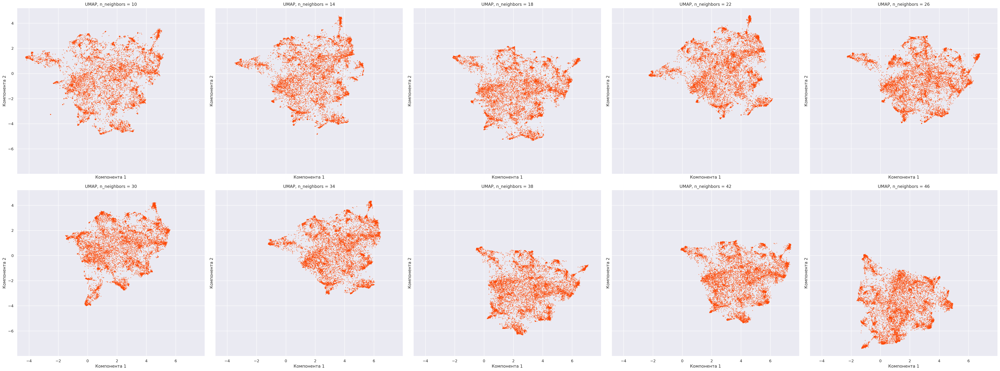

In [26]:
neighbors_list = np.arange(10, 50, 4)
fig, axes = plt.subplots(2, 5, figsize=(40, 15), sharex=True, sharey=True)

axes = axes.flatten()
for ax, neighbors in tqdm(zip(axes, neighbors_list)):
    umap_model = UMAP(
        n_neighbors=neighbors,
        n_components=2,
        min_dist=0.0,
        metric="cosine",
        random_state=100,
    )
    # Применяем UMAP к данным
    umap_result = umap_model.fit_transform(embeddings)
    # Визуализируем результаты
    ax.scatter(umap_result[:, 0], umap_result[:, 1], alpha=0.4, c="orangered", s=2)
    ax.set_title(f"UMAP, n_neighbors = {neighbors}")
    ax.set_xlabel("Компонента 1")
    ax.set_ylabel("Компонента 2")

plt.tight_layout()
plt.show()

#### Разобьем данные на кластеры с помощью HDBSCAN:

In [27]:
from hdbscan import HDBSCAN
# from cuml.cluster.hdbscan import HDBSCAN

#### Покажем результаты кластеризации:

In [28]:
# Уменьшим размерность с помощью UMAP
umap_model = UMAP(
    n_neighbors=15,
    n_components=2,
    min_dist=0.0,
    metric="cosine",
    random_state=100,
)
umap_result = umap_model.fit_transform(embeddings)

10it [00:03,  2.57it/s]


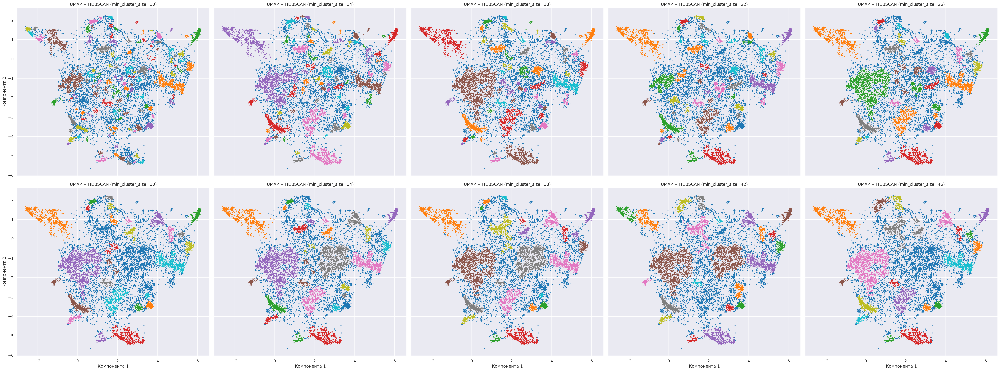

In [29]:
sizes = np.arange(10, 50, 4)
fig, axes = plt.subplots(2, 5, figsize=(40, 15), sharex=True, sharey=True)

axes = axes.flatten()
for ax, size in tqdm(zip(axes, sizes)):
    # Кластеризуем данные с помощью HDBSCAN
    hdbscan_model = HDBSCAN(
        min_cluster_size=size, metric="euclidean", prediction_data=True
    )
    hdbscan_labels = hdbscan_model.fit_predict(umap_result)
    # Создадим DataFrame с результатами UMAP и метками HDBSCAN
    df = pd.DataFrame(umap_result, columns=[f"UMAP{i+1}" for i in range(0, 2, 1)])
    df["Cluster"] = hdbscan_labels
    # Рассеянная диаграмма для результатов UMAP
    sns.scatterplot(
        x="UMAP1",
        y="UMAP2",
        hue="Cluster",
        data=df,
        palette="tab10",
        legend=None,
        linewidth=0,
        s=8,
        ax=ax,
    ).set_title(f"UMAP + HDBSCAN (min_cluster_size={size})")
    ax.set_xlabel("Компонента 1")
    ax.set_ylabel("Компонента 2")

plt.tight_layout()
plt.show()

#### Подставим выбранные гипермараметры для UMAP и HDBSCAN:

Гиперпараметры выбраны с учетом целей:

1. Cохранить локальную структуру данных после уменьшения размерности данных, UMAP
2. Уменьшить количество шума в кластерах, HDBSCAN
3. Создать список понятных тем на выходе

In [30]:
umap_model = UMAP(
    n_neighbors=15,
    n_components=5,
    min_dist=0.0,
    metric="cosine",
    random_state=100,
)
hdbscan_model = HDBSCAN(min_cluster_size=15, metric="euclidean", prediction_data=True)

#### Удалим стоп-слова после распределения текстов по темам:

In [31]:
spacy_stopwords = spacy.lang.en.stop_words.STOP_WORDS

In [32]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer_model = CountVectorizer(
    stop_words=list(spacy_stopwords), min_df=0.03, max_df=0.99, ngram_range=(1, 2)
)

#### Запустим пайплайн и обучим модель:

Модель MaximalMarginalRelevance изменяет порядок слов в темах, чтобы убрать смысловые повторения и составить последовательность из самых значимых слов.

In [33]:
# Создаем модель BERTopic
representation_model = MaximalMarginalRelevance()
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    representation_model=representation_model,
    language="english",
    verbose=True,
    nr_topics="auto",
)

# Обучаем модель
topics, probs = topic_model.fit_transform(clean_data, embeddings)

# Получаем темы
topic_representation = topic_model.get_topic_info()

2024-10-28 16:25:00,684 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm


2024-10-28 16:25:01,379 - BERTopic - Dimensionality - Completed ✓
2024-10-28 16:25:01,381 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-10-28 16:25:01,905 - BERTopic - Cluster - Completed ✓
2024-10-28 16:25:01,906 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-10-28 16:25:05,658 - BERTopic - Representation - Completed ✓
2024-10-28 16:25:05,659 - BERTopic - Topic reduction - Reducing number of topics
2024-10-28 16:25:08,300 - BERTopic - Topic reduction - Reduced number of topics from 61 to 39


### Темы:

#### Выведем список тем:

In [34]:
topic_representation["Name"].to_list()

['-1_trump_like_vote_election',
 '0_nazi_rally_trump_fascist',
 '1_amazon_bezos_wapo_cancel',
 '2_puerto_ricans_puerto ricans_puerto rico',
 '3_harris_trump_vote_polls',
 '4_jokes_comedian_comedy_humor',
 '5_yes yes_thank_true_comment',
 '6_israel_palestine_netanyahu_trump',
 '7_citizenship_deport_citizen_canada',
 '8_abortion_abortions_states_life',
 '9_maga_vote_republicans_republican',
 '10_bad bunny_puerto_puerto rican_ricky martin',
 '11_polls_early voting_polling_voters',
 '12_antichrist_jesus_christ_christians',
 '13_pee_diapers_pee bottles_piss',
 '14_biden_mental decline_inflation_joe biden',
 '15_musk_elon musk_tesla_spacex',
 '16_rich_billionaires_wealth_billionaire',
 '17_putin_russian_russia_ukraine',
 '18_prices_inflation_tariffs_price',
 '19_dc_forecast_metro_crowd',
 '20_vance_tapper_jd vance_trump',
 '21_nyc_ny_long island_new york',
 '22_left_radical left_liberal_left liberal',
 '23_political suicide_suicide_political_suicide trump',
 '24_scotus_amendment_slavery_supr

#### Покажем темы на графиках:

In [35]:
import plotly.io as pio

pio.renderers.default = "notebook+vscode+jupyterlab"

In [36]:
topic_model.visualize_topics()

In [37]:
hierarchical_topics = topic_model.hierarchical_topics(clean_data)

100%|██████████| 37/37 [00:02<00:00, 14.52it/s]


In [38]:
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

In [39]:
tree = topic_model.get_topic_tree(hierarchical_topics)

In [40]:
print(tree)

.
├─puerto_rico_puerto rico_ricans_puerto ricans
│    ├─jokes_comedian_comedy_racist_kill tony
│    │    ├─watermelon_watermelons_carving watermelons_racist_black people
│    │    │    ├─■──racism_racist_racists_context_alleged racism ── Topic: 28
│    │    │    └─■──watermelon_watermelons_carving watermelons_black people_black friends ── Topic: 29
│    │    └─jokes_comedian_comedy_racist_kill tony
│    │         ├─jokes_comedian_comedy_humor_kill tony
│    │         │    ├─■──hinchcliffe_tony hinchcliffe_tony_gay man_humor ── Topic: 34
│    │         │    └─■──jokes_comedian_comedy_humor_kill tony ── Topic: 4
│    │         └─■──rogan_joe_joe rogan_comedian_comedy ── Topic: 31
│    └─puerto_rico_puerto rico_ricans_puerto ricans
│         ├─■──puerto_ricans_puerto ricans_puerto rico_puerto rican ── Topic: 2
│         └─■──bad bunny_puerto_puerto rican_ricky martin_rico ── Topic: 10
└─trump_vote_biden_election_israel
     ├─trump_vote_election_rally_voting
     │    ├─amazon_bezos_wapo_

## Сохраним результат моделирования за день в формате csv:

#### Создадим датафрейм с данными:

In [41]:
topics_bert = topic_representation["Name"].to_list()

# Получим текущую дату и время
now = datetime.now()
# Преобразуем их в строку в формате YYYYMMDD
date_str = now.strftime("%Y_%m_%d")

df_bert = pd.DataFrame(
    data=topic_model.generate_topic_labels(nr_words=None, topic_prefix=False),
    columns=["topics"],
)
df_bert["date"] = date_str
df_bert["size"] = df_bert.index
df_bert = df_bert[["date", "size", "topics"]]

In [42]:
def clean_df_bert(df):
    df = re.sub(r"_", ",", df)
    return df

In [43]:
df_bert["topics"] = df_bert["topics"].apply(clean_df_bert)
print(df_bert)

          date  size                                             topics
0   2024_10_28     0  trump,like,vote,election,rally,voting,voters,p...
1   2024_10_28     1  nazi,rally,trump,fascist,hitler,nazi rally,naz...
2   2024_10_28     2  amazon,bezos,wapo,cancel,amazon prime,washingt...
3   2024_10_28     3  puerto,ricans,puerto ricans,puerto rico,puerto...
4   2024_10_28     4  harris,trump,vote,polls,vote harris,election,v...
5   2024_10_28     5  jokes,comedian,comedy,humor,kill tony,comedian...
6   2024_10_28     6  yes yes,thank,true,comment,thanks,want,good,fe...
7   2024_10_28     7  israel,palestine,netanyahu,trump,palestinians,...
8   2024_10_28     8  citizenship,deport,citizen,canada,deported,ill...
9   2024_10_28     9  abortion,abortions,states,life,pro life,500,pr...
10  2024_10_28    10  maga,vote,republicans,republican,issue voters,...
11  2024_10_28    11  bad bunny,puerto,puerto rican,ricky martin,ric...
12  2024_10_28    12  polls,early voting,polling,voters,election

In [44]:
def save_dataframe(df):
    # Получим текущую дату и время
    now = datetime.now()

    # Преобразуем их в строку в формате YYYYMMDD
    date_str = now.strftime("%Y_%m_%d")

    # Сохраним DataFrame в CSV-файл с текущей датой в имени файла
    df.to_csv(
        f"hot_csvs/{subreddit.display_name}_topics_{date_str}.csv",
        index=False,
    )

In [45]:
save_dataframe(df_bert)

## Выводы

Был построен алгоритм, который собирает данные из открытого источника информации - раздела Politics из форума Reddit, затем извлекает самые обсуждаемые темы с помощью модели BERTopic. С небольшими доработками, можно превратить этот ноутбук в скрипт, который будет запускаться по расписанию и собирать данные. Когда накопиться требуемый обьем данных - можно проводить новые исследования. Например, динамическое тематическое моделирование с целью исследования изменения трендов в обсуждениях со временем.

В работе не представлены метрики для оценки качества модели, т.к. отсутсвие надежных метрик - одна из актуальных проблем в области тематического моделирования. Наилучший результат, который подвержен субьективности, достигается с помощью перебора разных параметров модели. По этой причине, BERTopic выгодно отличается от других решений, т.к. с каждым алгоритмом в модели можно экспериментировать отдельно и не проводить каждый раз полное моделирование. В целом, этот проект направлен на дальнейшую автоматизацию и требует тематическую модель, которая будет показывать понятные темы с минимальной настройкой гиперпараметров, т.к. скрипт для извлечения тем будет запускаться автоматически. BERTopic - единственная на данный момент модель, которая позволяет сделать это.